# scplotter to work with 10x Visium data prepared by Seurat

See: <https://satijalab.org/seurat/articles/spatial_vignette#x-visium>

Go back to scplotter documentation: <https://pwwang.github.io/scplotter/>

In [ ]:
suppressPackageStartupMessages({
    library(Seurat)
    library(SeuratData)
})
# Load the scplotter package
# library(scplotter)
devtools::load_all()

suppressWarnings(suppressMessages({
    brain <- LoadData("stxBrain", type = "anterior1")
    brain <- SCTransform(brain, assay = "Spatial", verbose = FALSE)
    brain <- RunPCA(brain, assay = "SCT", verbose = FALSE)
    brain <- FindNeighbors(brain, reduction = "pca", dims = 1:30)
    brain <- FindClusters(brain, verbose = FALSE)
    brain <- RunUMAP(brain, reduction = "pca", dims = 1:30)
}))
brain

ℹ Loading scplotter


An object of class Seurat 
48721 features across 2696 samples within 2 assays 
Active assay: SCT (17668 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: Spatial
 2 dimensional reductions calculated: pca, umap
 1 spatial field of view present: anterior1

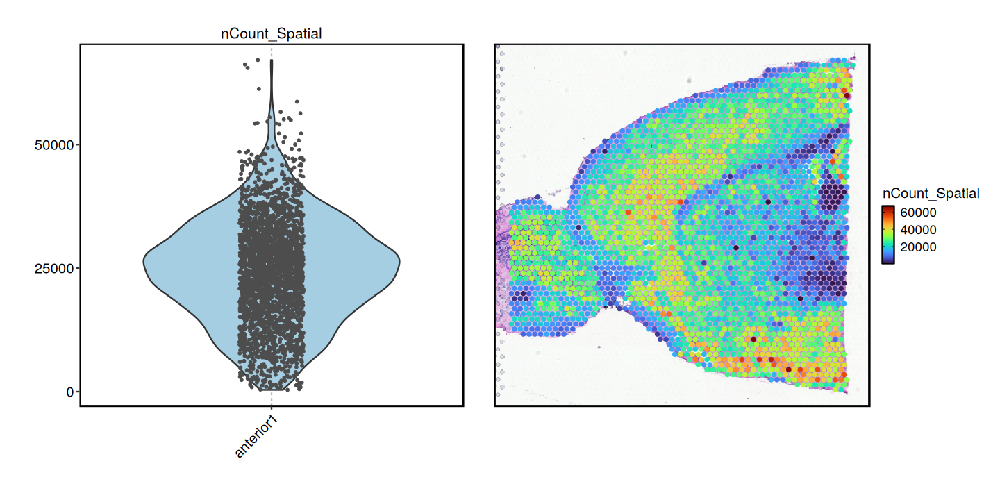

In [2]:
options(repr.plot.width = 12, repr.plot.height = 6)

plot1 <- FeatureStatPlot(brain, features = "nCount_Spatial",
    ident = "orig.ident", add_point = TRUE, legend.position = "none")
plot2 <- scplotter::SpatialFeaturePlot(brain, features = "nCount_Spatial")

plot1 + plot2

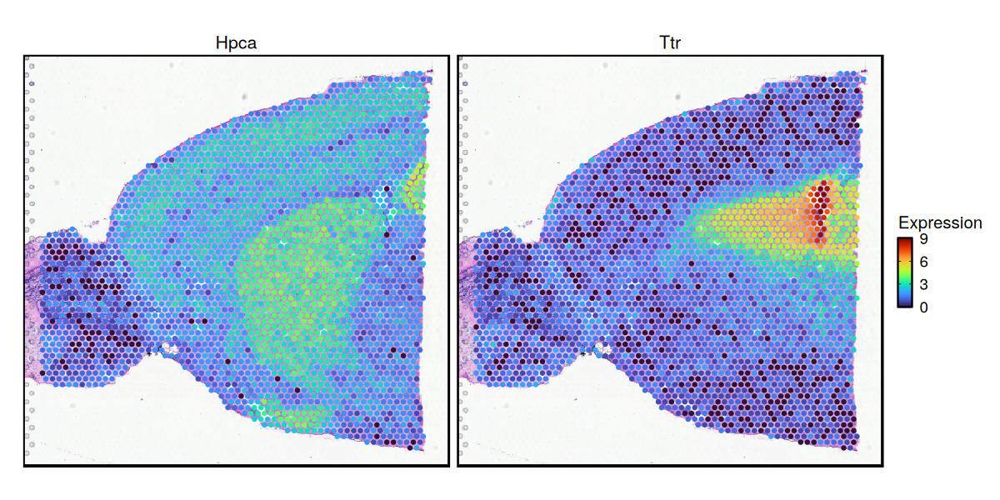

In [3]:
options(repr.plot.width = 10, repr.plot.height = 5)

SpatialFeaturePlot(brain, features = c("Hpca", "Ttr"),
    points_color_name = "Expression", points_size_by = 1.2)

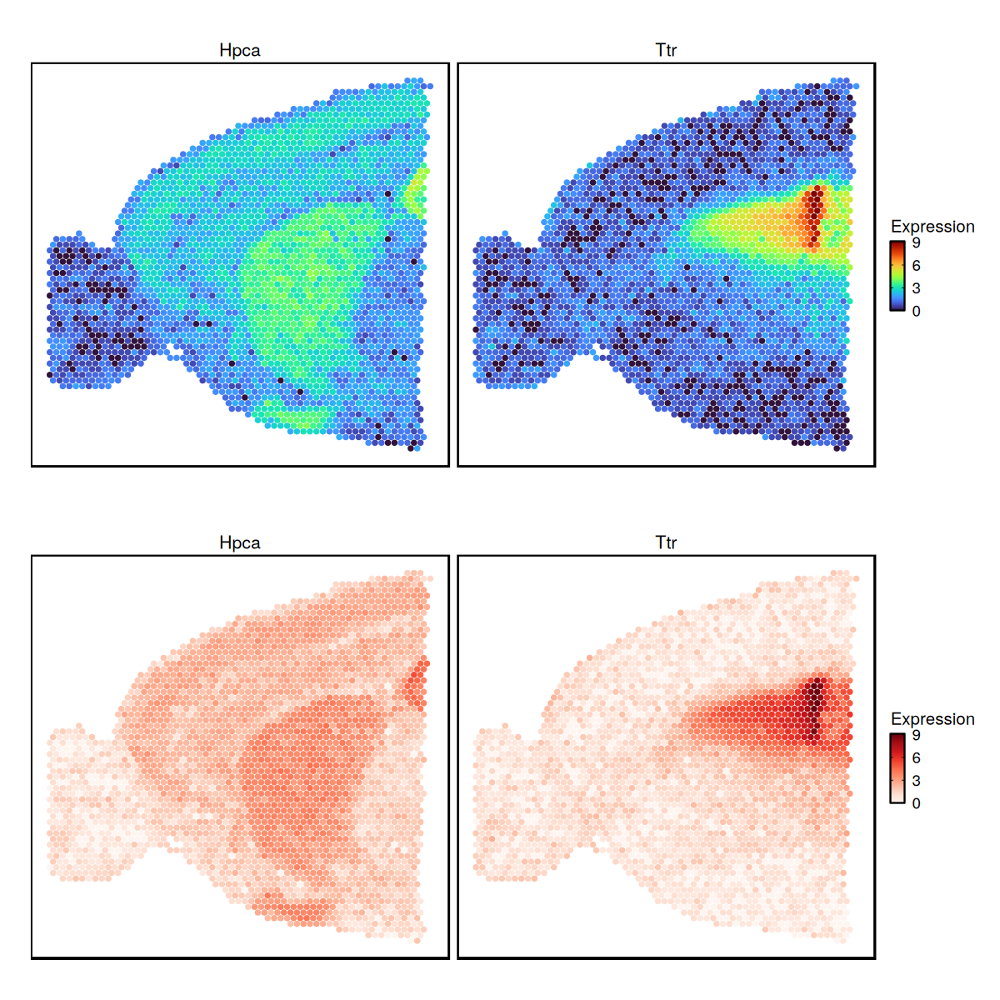

In [4]:
# Plot without image
options(repr.plot.width = 10, repr.plot.height = 10)

p1 <- SpatialFeaturePlot(brain, image = FALSE, features = c("Hpca", "Ttr"),
    points_color_name = "Expression")

# or provide only points layers, and with a different palette
p2 <- SpatialFeaturePlot(brain, layers = "points", features = c("Hpca", "Ttr"),
    points_color_name = "Expression", palette = "Reds")

p1 / p2

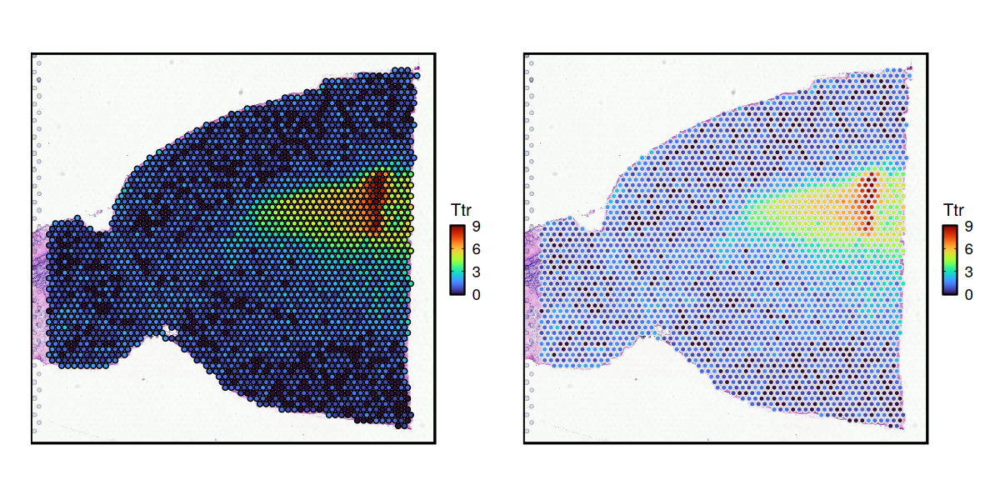

In [5]:
options(repr.plot.width = 10, repr.plot.height = 5)

p1 <- SpatialFeaturePlot(brain, features = "Ttr",
    points_shape = 21, points_size_by = 1.2, points_border_width = 0.1,
    )
p2 <- SpatialFeaturePlot(brain, features = "Ttr",
    points_shape = 21, points_border_alpha = 0.1, points_border_width = 0.1,
    points_size_by = 1.2)
p1 + p2

Forcing label to be TRUE when label_repel or label_insitu is TRUE.



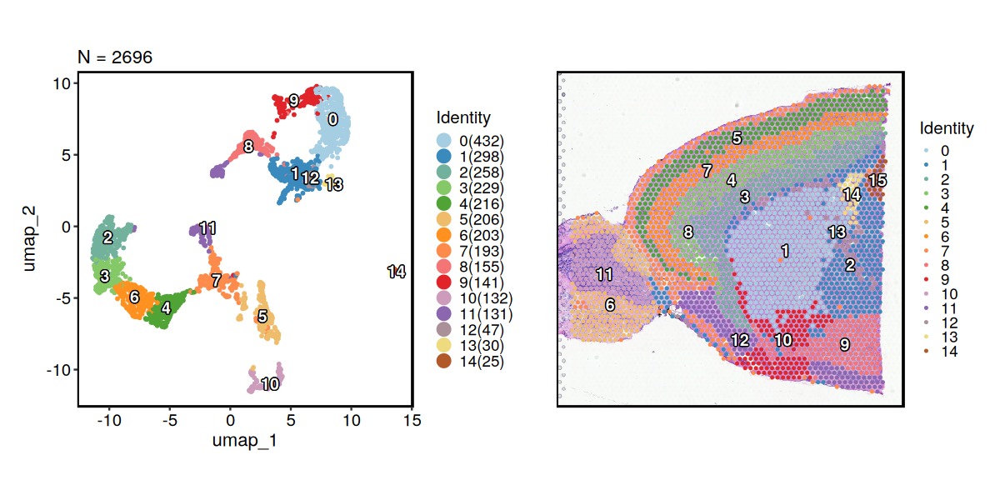

In [6]:
options(repr.plot.width = 10, repr.plot.height = 5)

p1 <- CellDimPlot(brain, label_insitu = TRUE)
p2 <- SpatialDimPlot(brain, points_size_by = 0.8, label = TRUE)
p1 + p2

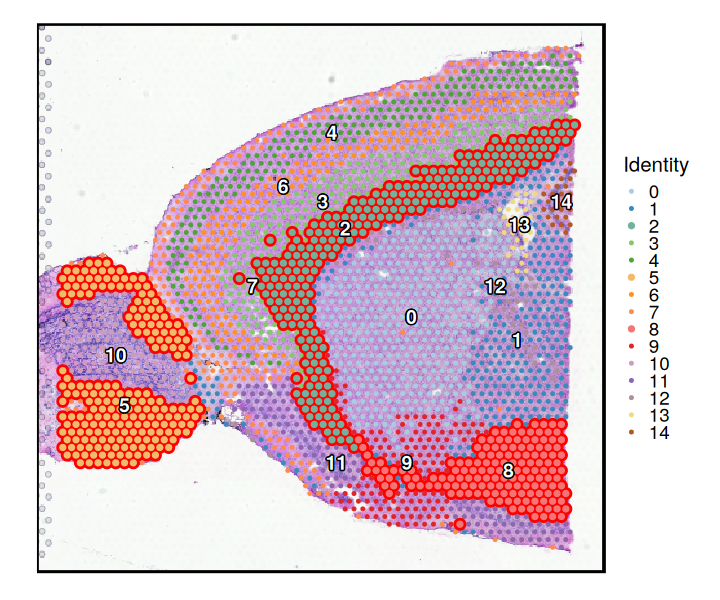

In [7]:
options(repr.plot.width = 6, repr.plot.height = 5)

SpatialDimPlot(brain, points_size_by = 0.8,
    label = TRUE, label_insitu = TRUE,
    highlight_color = "red", highlight_stroke = 1.6,
    highlight = 'seurat_clusters %in% c("2", "5", "8")')

Warning message:
“`PackageCheck()` was deprecated in SeuratObject 5.0.0.
ℹ Please use `rlang::check_installed()` instead.
ℹ The deprecated feature was likely used in the Seurat package.
  Please report the issue at <https://github.com/satijalab/seurat/issues>.”


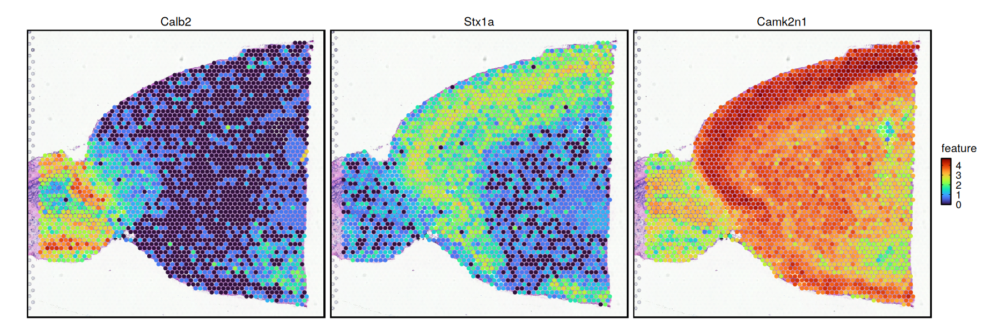

In [8]:
de_markers <- FindMarkers(brain, ident.1 = 5, ident.2 = 6)

options(repr.plot.width = 15, repr.plot.height = 5)

SpatialFeaturePlot(brain, features = rownames(de_markers)[1:3])

Warning message in dist(x = pos):
“NAs introduced by coercion”


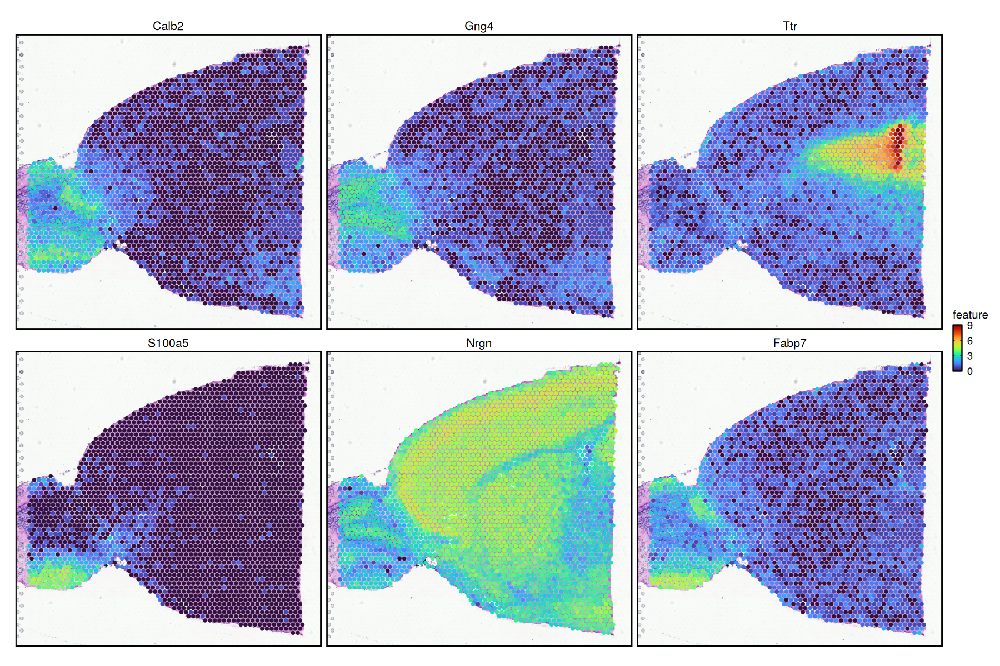

In [10]:
brain <- suppressMessages({
    FindSpatiallyVariableFeatures(
        brain, assay = "SCT", features = VariableFeatures(brain)[1:1000],
        selection.method = "moransi")
})
top.features <- head(SpatiallyVariableFeatures(brain, selection.method = "moransi"), 6)

options(repr.plot.width = 15, repr.plot.height = 10)

SpatialFeaturePlot(brain, features = top.features)

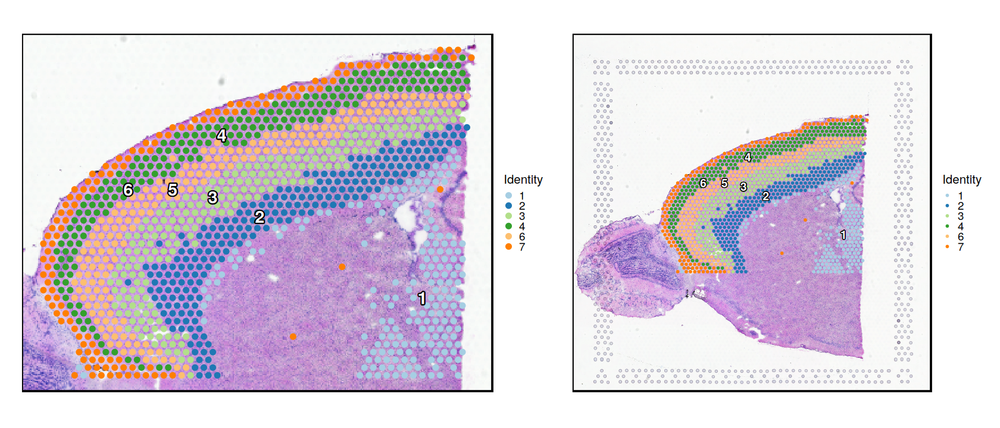

In [ ]:
coords <- GetTissueCoordinates(brain, image = "anterior1")
scale_factor <- brain@images$anterior1@scale.factors$lowres
coords$x <- coords$x * scale_factor
coords$y <- coords$y * scale_factor
cells <- coords[coords$y > 150 & coords$y < 500 & coords$x > 0 & coords$x < 400, "cell"]

suppressWarnings({
    cortex <- subset(brain, cells = cells)
    cortex <- subset(cortex, idents = c(1, 2, 3, 4, 6, 7))
})

options(repr.plot.width = 14, repr.plot.height = 6)
p1 <- SpatialDimPlot(cortex, label = TRUE, label_size = 6, points_size_by = 2.5)
p2 <- SpatialDimPlot(cortex, label = TRUE, points_size_by = 1, crop = FALSE)

p1 + p2